In [22]:
# Cell 1: Imports + basic setup
# Purpose: Import required libraries, set seeds, and select device (CPU/GPU).

import os
import copy
import time
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models

from sklearn.metrics import f1_score
from tqdm import tqdm


def set_seed(seed: int = 42):
    """Set random seeds for reproducibility."""
    import random
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


set_seed(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


In [23]:
# Cell 2: Evaluation function
# Purpose: Evaluate model performance (loss, accuracy, macro-F1) on a dataloader.

@torch.no_grad()
def evaluate(model, dataloader, device):
    """
    Evaluate model on a dataloader.
    Returns: avg_loss, accuracy, macro_f1
    """
    model.eval()
    criterion = nn.CrossEntropyLoss()

    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    all_preds = []
    all_labels = []

    for images, labels in tqdm(dataloader, desc="Eval", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        logits = model(images)
        loss = criterion(logits, labels)

        total_loss += loss.item() * labels.size(0)
        preds = torch.argmax(logits, dim=1)

        total_correct += (preds == labels).sum().item()
        total_samples += labels.size(0)

        all_preds.append(preds.cpu().numpy())
        all_labels.append(labels.cpu().numpy())

    avg_loss = total_loss / total_samples
    acc = total_correct / total_samples

    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)
    macro_f1 = f1_score(all_labels, all_preds, average="macro")

    return avg_loss, acc, macro_f1


In [24]:
# Cell 3: One-epoch training function
# Purpose: Train the model for exactly one epoch and compute training metrics.

def train_one_epoch(model, dataloader, optimizer, device):
    """
    Train model for one epoch.
    Returns: avg_loss, accuracy, macro_f1
    """
    model.train()
    criterion = nn.CrossEntropyLoss()

    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    all_preds = []
    all_labels = []

    for images, labels in tqdm(dataloader, desc="Train", leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        logits = model(images)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * labels.size(0)
        preds = torch.argmax(logits, dim=1)

        total_correct += (preds == labels).sum().item()
        total_samples += labels.size(0)

        all_preds.append(preds.detach().cpu().numpy())
        all_labels.append(labels.detach().cpu().numpy())

    avg_loss = total_loss / total_samples
    acc = total_correct / total_samples

    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)
    macro_f1 = f1_score(all_labels, all_preds, average="macro")

    return avg_loss, acc, macro_f1


In [25]:
# Cell 4: Fit function (multi-epoch training)
# Purpose: Train for multiple epochs, evaluate each epoch, and save best checkpoint.

def fit(model, train_loader, val_loader, device, epochs, lr, weight_decay, save_path):
    """
    Full training routine with best-checkpoint saving based on validation macro F1.
    """
    optimizer = optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=lr,
        weight_decay=weight_decay,
    )

    best_model_wts = copy.deepcopy(model.state_dict())
    best_val_f1 = -1.0

    history = []

    for epoch in range(1, epochs + 1):
        t0 = time.time()

        train_loss, train_acc, train_f1 = train_one_epoch(model, train_loader, optimizer, device)
        val_loss, val_acc, val_f1 = evaluate(model, val_loader, device)

        elapsed = time.time() - t0

        log = {
            "epoch": epoch,
            "train_loss": train_loss,
            "train_acc": train_acc,
            "train_f1": train_f1,
            "val_loss": val_loss,
            "val_acc": val_acc,
            "val_f1": val_f1,
            "time_sec": elapsed,
        }
        history.append(log)

        print(
            f"Epoch {epoch:02d}/{epochs} | "
            f"Train: loss {train_loss:.4f}, acc {train_acc:.4f}, f1 {train_f1:.4f} | "
            f"Val: loss {val_loss:.4f}, acc {val_acc:.4f}, f1 {val_f1:.4f} | "
            f"time {elapsed:.1f}s"
        )

        # Save the best model (based on validation macro F1)
        if val_f1 > best_val_f1:
            best_val_f1 = val_f1
            best_model_wts = copy.deepcopy(model.state_dict())
            torch.save(best_model_wts, save_path)
            print(f"  -> Saved best model to: {save_path} (val_f1={best_val_f1:.4f})")

    # Load the best weights at the end
    model.load_state_dict(best_model_wts)
    return model, history


In [26]:
# Cell 5: Dataset + DataLoader
# Purpose: Create transforms, download Food-101, and build dataloaders.

data_root = "./data_food101"   # dataset download directory
batch_size = 64
num_workers = 4
img_size = 224

# ImageNet normalization (required because ResNet34 is pretrained on ImageNet)
imagenet_mean = (0.485, 0.456, 0.406)
imagenet_std = (0.229, 0.224, 0.225)

train_tfms = transforms.Compose([
    transforms.RandomResizedCrop(img_size, scale=(0.7, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std),
])

val_tfms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(img_size),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std),
])

# Food101 provides split="train" and split="test"
train_ds = datasets.Food101(root=data_root, split="train", transform=train_tfms, download=True)
val_ds = datasets.Food101(root=data_root, split="test", transform=val_tfms, download=True)

train_loader = DataLoader(
    train_ds, batch_size=batch_size, shuffle=True,
    num_workers=num_workers, pin_memory=True
)
val_loader = DataLoader(
    val_ds, batch_size=batch_size, shuffle=False,
    num_workers=num_workers, pin_memory=True
)

num_classes = 101
print(f"Train samples: {len(train_ds)} | Val samples: {len(val_ds)}")


Train samples: 75750 | Val samples: 25250


In [29]:
# Cell 6: Model creation (ResNet34 pretrained)
# Purpose: Load pretrained ResNet34 and replace the final layer for 101 classes.

weights = models.ResNet34_Weights.DEFAULT
model = models.resnet34(weights=weights)

# Replace final classification layer (fc)
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)

model = model.to(device)
print(model.fc)


Linear(in_features=512, out_features=101, bias=True)


In [30]:
# Cell 7: Stage 1 training (freeze backbone)
# Purpose: Train only the classifier head (fc) while freezing the pretrained backbone.

os.makedirs("./checkpoints", exist_ok=True)

# Freeze everything
for param in model.parameters():
    param.requires_grad = False

# Unfreeze only the classifier head
for param in model.fc.parameters():
    param.requires_grad = True

stage1_ckpt = "./checkpoints/resnet34_food101_stage1_best.pt"

model, hist1 = fit(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=5,          # warm-up; you can increase to 5-10
    lr=1e-3,
    weight_decay=1e-4,
    save_path=stage1_ckpt,
)

print("Stage 1 done. Best checkpoint:", stage1_ckpt)


Epoch 01/5 | Train: loss 2.6790, acc 0.3770, f1 0.3667 | Val: loss 1.8165, acc 0.5490, f1 0.5387 | time 232.8s
  -> Saved best model to: ./checkpoints/resnet34_food101_stage1_best.pt (val_f1=0.5387)


Epoch 02/5 | Train: loss 2.0856, acc 0.4841, f1 0.4777 | Val: loss 1.6788, acc 0.5722, f1 0.5681 | time 232.8s
  -> Saved best model to: ./checkpoints/resnet34_food101_stage1_best.pt (val_f1=0.5681)


Epoch 03/5 | Train: loss 1.9964, acc 0.5017, f1 0.4960 | Val: loss 1.6486, acc 0.5750, f1 0.5688 | time 232.8s
  -> Saved best model to: ./checkpoints/resnet34_food101_stage1_best.pt (val_f1=0.5688)


Epoch 04/5 | Train: loss 1.9359, acc 0.5151, f1 0.5097 | Val: loss 1.6075, acc 0.5884, f1 0.5846 | time 231.5s
  -> Saved best model to: ./checkpoints/resnet34_food101_stage1_best.pt (val_f1=0.5846)


Epoch 05/5 | Train: loss 1.9118, acc 0.5210, f1 0.5158 | Val: loss 1.6040, acc 0.5859, f1 0.5777 | time 233.0s
Stage 1 done. Best checkpoint: ./checkpoints/resnet34_food101_stage1_best.pt


In [34]:
# Cell 7A: Final evaluation   (Stage 1)
# Purpose: Evaluate Stage 1 model and visualize 10 random validation samples.

import matplotlib.pyplot as plt
import random

# Ensure evaluation mode
model.eval()

# ---------
# Metrics
# ---------
val_loss, val_acc, val_f1 = evaluate(model, val_loader, device)

print("\n=== Final Validation Metrics (Stage 1) ===")
print(f"Val loss: {val_loss:.4f}")
print(f"Val acc : {val_acc:.4f}")
print(f"Val F1  : {val_f1:.4f}")




=== Final Validation Metrics (Stage 1) ===
Val loss: 1.6075
Val acc : 0.5884
Val F1  : 0.5846


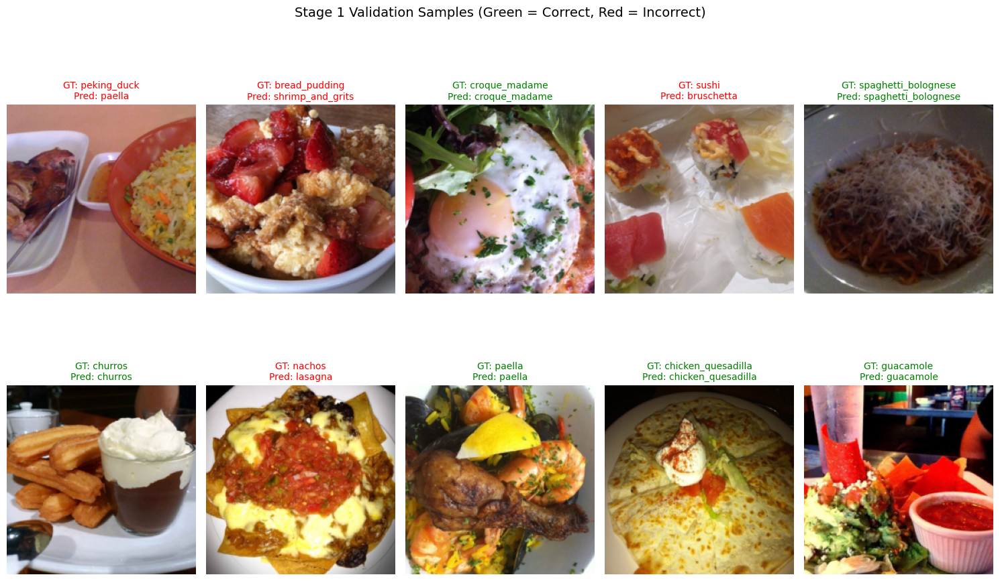

In [35]:
# Cell7B: visualization
# -----------------
# Visualization
# -----------------
class_names = val_ds.classes

imagenet_mean = np.array([0.485, 0.456, 0.406])
imagenet_std = np.array([0.229, 0.224, 0.225])

def denormalize(img_tensor):
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = img * imagenet_std + imagenet_mean
    return np.clip(img, 0, 1)

# Randomly sample 10 images from the entire validation dataset
sample_indices = random.sample(range(len(val_ds)), 10)

plt.figure(figsize=(15, 10))

for i, idx in enumerate(sample_indices):
    img, label = val_ds[idx]
    img = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred = model(img).argmax(dim=1).item()

    plt.subplot(2, 5, i + 1)
    plt.imshow(denormalize(img.squeeze(0)))
    plt.axis("off")

    gt = class_names[label]
    pd = class_names[pred]
    color = "green" if label == pred else "red"

    plt.title(f"GT: {gt}\nPred: {pd}", color=color, fontsize=10)

plt.suptitle(
    "Stage 1 Validation Samples (Green = Correct, Red = Incorrect)",
    fontsize=14
)
plt.tight_layout()
plt.show()


In [36]:
# Cell 8: Stage 2 fine-tuning (unfreeze layer4)
# Purpose: Fine-tune last ResNet block (layer4) + classifier for better adaptation.

# Unfreeze layer4 and fc
for param in model.layer4.parameters():
    param.requires_grad = True
for param in model.fc.parameters():
    param.requires_grad = True

stage2_ckpt = "./checkpoints/resnet34_food101_stage2_best.pt"

model, hist2 = fit(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    device=device,
    epochs=5,          # main fine-tuning; you can increase to 10+
    lr=1e-4,           # smaller LR is safer for fine-tuning pretrained weights
    weight_decay=1e-4,
    save_path=stage2_ckpt,
)

print("Stage 2 done. Best checkpoint:", stage2_ckpt)


Epoch 01/5 | Train: loss 1.5577, acc 0.5987, f1 0.5953 | Val: loss 1.0509, acc 0.7168, f1 0.7133 | time 233.9s
  -> Saved best model to: ./checkpoints/resnet34_food101_stage2_best.pt (val_f1=0.7133)


Epoch 02/5 | Train: loss 1.1619, acc 0.6909, f1 0.6888 | Val: loss 0.9648, acc 0.7367, f1 0.7353 | time 233.1s
  -> Saved best model to: ./checkpoints/resnet34_food101_stage2_best.pt (val_f1=0.7353)


Epoch 03/5 | Train: loss 0.9703, acc 0.7354, f1 0.7340 | Val: loss 0.9268, acc 0.7463, f1 0.7447 | time 233.5s
  -> Saved best model to: ./checkpoints/resnet34_food101_stage2_best.pt (val_f1=0.7447)


Epoch 04/5 | Train: loss 0.8219, acc 0.7699, f1 0.7690 | Val: loss 0.9283, acc 0.7459, f1 0.7446 | time 234.2s


Epoch 05/5 | Train: loss 0.6969, acc 0.8033, f1 0.8026 | Val: loss 0.9211, acc 0.7514, f1 0.7505 | time 231.4s
  -> Saved best model to: ./checkpoints/resnet34_food101_stage2_best.pt (val_f1=0.7505)
Stage 2 done. Best checkpoint: ./checkpoints/resnet34_food101_stage2_best.pt


In [37]:
# Cell 9: Final evaluation
# Purpose: Evaluate the final best model on validation/test split.

val_loss, val_acc, val_f1 = evaluate(model, val_loader, device)

print("\n=== Final Validation Metrics (Best Stage 2) ===")
print(f"Val loss: {val_loss:.4f}")
print(f"Val acc : {val_acc:.4f}")
print(f"Val F1  : {val_f1:.4f}")



=== Final Validation Metrics (Best Stage 2) ===
Val loss: 0.9211
Val acc : 0.7514
Val F1  : 0.7505


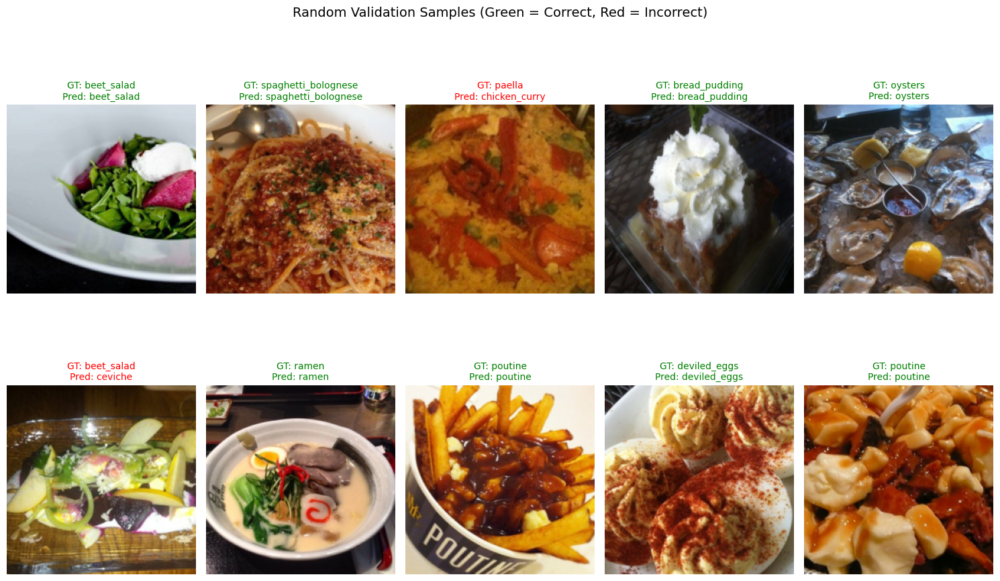

In [38]:
# Cell 9A (FIXED): Truly random samples from the entire validation dataset

import matplotlib.pyplot as plt
import random

model.eval()
class_names = val_ds.classes

imagenet_mean = np.array([0.485, 0.456, 0.406])
imagenet_std = np.array([0.229, 0.224, 0.225])

def denormalize(img_tensor):
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = img * imagenet_std + imagenet_mean
    return np.clip(img, 0, 1)

# Randomly sample 10 indices from the entire validation dataset
sample_indices = random.sample(range(len(val_ds)), 10)

plt.figure(figsize=(15, 10))

for i, idx in enumerate(sample_indices):
    img, label = val_ds[idx]
    img = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred = model(img).argmax(dim=1).item()

    plt.subplot(2, 5, i + 1)
    plt.imshow(denormalize(img.squeeze(0)))
    plt.axis("off")

    gt = class_names[label]
    pd = class_names[pred]
    color = "green" if label == pred else "red"

    plt.title(f"GT: {gt}\nPred: {pd}", color=color, fontsize=10)

plt.suptitle(
    "Random Validation Samples (Green = Correct, Red = Incorrect)",
    fontsize=14
)
plt.tight_layout()
plt.show()


In [39]:
# Cell 10: Load best checkpoint + pick target layer
# Purpose: Load the best Stage 2 checkpoint and select the target convolutional layer for Grad-CAM.

import torch

# Path to best stage-2 checkpoint (change if your path is different)
best_ckpt_path = "./checkpoints/resnet34_food101_stage2_best.pt"

# Load weights into the existing model object
state_dict = torch.load(best_ckpt_path, map_location=device)
model.load_state_dict(state_dict)
model.eval()

print(f"Loaded checkpoint: {best_ckpt_path}")

# Pick a target layer for Grad-CAM (last conv in the last ResNet block)
target_layer = model.layer4[-1].conv2
print("Target layer for Grad-CAM:", target_layer)


Loaded checkpoint: ./checkpoints/resnet34_food101_stage2_best.pt
Target layer for Grad-CAM: Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)


In [40]:
# Cell 11: Grad-CAM implementation (hooks)
# Purpose: Implement Grad-CAM using forward/backward hooks to capture activations and gradients.

import torch.nn.functional as F

class GradCAM:
    """
    Grad-CAM for CNN classifiers.
    Steps:
      1) Forward hook: store feature maps (activations)
      2) Backward hook: store gradients w.r.t. feature maps
      3) Weight each channel by global-average pooled gradients
      4) ReLU + normalize to [0, 1]
    """
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer

        self.activations = None
        self.gradients = None

        self.fwd_handle = None
        self.bwd_handle = None

        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, inp, out):
            # out shape: [B, C, H, W]
            self.activations = out.detach()

        def backward_hook(module, grad_in, grad_out):
            # grad_out[0] shape: [B, C, H, W]
            self.gradients = grad_out[0].detach()

        self.fwd_handle = self.target_layer.register_forward_hook(forward_hook)
        # Use full backward hook for better behavior in newer PyTorch
        self.bwd_handle = self.target_layer.register_full_backward_hook(backward_hook)

    def remove_hooks(self):
        """Cleanly remove hooks (good practice)."""
        if self.fwd_handle is not None:
            self.fwd_handle.remove()
        if self.bwd_handle is not None:
            self.bwd_handle.remove()

    def generate(self, input_tensor, class_idx=None):
        """
        Generate a Grad-CAM heatmap for a single image tensor.
        input_tensor: [1, 3, H, W]
        class_idx: int or None (if None, use predicted class)
        returns: heatmap (H, W) in [0, 1], predicted class index, logits
        """
        self.model.zero_grad()

        logits = self.model(input_tensor)  # [1, num_classes]
        pred_idx = int(torch.argmax(logits, dim=1).item())

        if class_idx is None:
            class_idx = pred_idx

        # Backprop the score for the target class
        score = logits[0, class_idx]
        score.backward(retain_graph=True)

        # activations: [1, C, h, w], gradients: [1, C, h, w]
        A = self.activations
        dA = self.gradients

        # Channel weights: global average pool gradients over spatial dims
        weights = dA.mean(dim=(2, 3), keepdim=True)  # [1, C, 1, 1]

        # Weighted sum of activations
        cam = (weights * A).sum(dim=1, keepdim=True)  # [1, 1, h, w]
        cam = F.relu(cam)

        # Upsample CAM to input image size
        cam = F.interpolate(cam, size=input_tensor.shape[-2:], mode="bilinear", align_corners=False)

        # Normalize to [0, 1]
        cam = cam[0, 0]
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)

        return cam.cpu().numpy(), pred_idx, logits.detach().cpu()


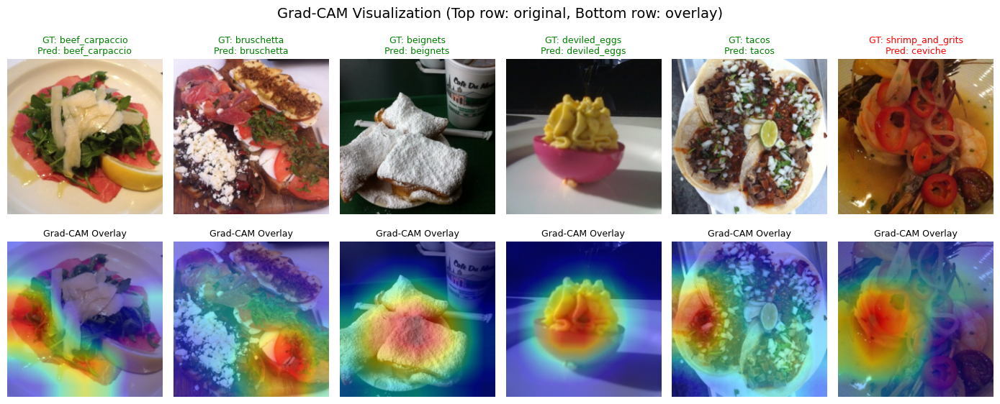

Saved overlays to: ./gradcam_outputs


In [42]:
# Cell 12: Overlay heatmap + show/save figures
# Purpose: Visualize Grad-CAM heatmaps and optionally save them.

import os
import numpy as np
import matplotlib.pyplot as plt
import random

# Class names from Food-101
class_names = val_ds.classes

# ImageNet normalization values (used in your transforms)
imagenet_mean = np.array([0.485, 0.456, 0.406])
imagenet_std = np.array([0.229, 0.224, 0.225])

def denormalize_img(img_tensor):
    """Convert normalized tensor image (3,H,W) to numpy (H,W,3) in [0,1]."""
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = img * imagenet_std + imagenet_mean
    return np.clip(img, 0, 1)

def overlay_cam_on_image(img_rgb, cam, alpha=0.4):
    """
    Overlay a heatmap (cam) on an RGB image.
    img_rgb: (H,W,3) float in [0,1]
    cam: (H,W) float in [0,1]
    """
    heatmap = plt.cm.jet(cam)[..., :3]  # (H,W,3) using matplotlib colormap
    overlay = (1 - alpha) * img_rgb + alpha * heatmap
    overlay = np.clip(overlay, 0, 1)
    return overlay

# Initialize Grad-CAM
gradcam = GradCAM(model, target_layer)

# Choose how many samples to visualize
num_samples = 6  # you can change to 10

# Optional: save outputs
save_dir = "./gradcam_outputs"
save_images = True
os.makedirs(save_dir, exist_ok=True)

# Randomly sample indices from the entire validation dataset
sample_indices = random.sample(range(len(val_ds)), num_samples)

plt.figure(figsize=(14, 6))

for i, idx in enumerate(sample_indices):
    img_tensor, label = val_ds[idx]  # img_tensor is already normalized by val_tfms
    input_tensor = img_tensor.unsqueeze(0).to(device)

    cam, pred_idx, _ = gradcam.generate(input_tensor, class_idx=None)

    img_rgb = denormalize_img(img_tensor)
    overlay = overlay_cam_on_image(img_rgb, cam, alpha=0.45)

    gt_name = class_names[label]
    pred_name = class_names[pred_idx]
    correct = (label == pred_idx)

    # --- Plot (two rows: original + overlay) ---
    plt.subplot(2, num_samples, i + 1)
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(f"GT: {gt_name}\nPred: {pred_name}", fontsize=9, color=("green" if correct else "red"))

    plt.subplot(2, num_samples, num_samples + i + 1)
    plt.imshow(overlay)
    plt.axis("off")
    plt.title("Grad-CAM Overlay", fontsize=9)

    # --- Save if requested ---
    if save_images:
        out_path = os.path.join(save_dir, f"idx{idx}_gt_{gt_name}_pred_{pred_name}.png")
        plt.imsave(out_path, overlay)

plt.suptitle("Grad-CAM Visualization (Top row: original, Bottom row: overlay)", fontsize=14)
plt.tight_layout()
plt.show()

# Clean up hooks (optional but good practice)
gradcam.remove_hooks()

print(f"Saved overlays to: {save_dir}" if save_images else "Not saving images.")


Building misclassification pool: 100%|██████████| 395/395 [00:33<00:00, 11.78it/s]


Total misclassified samples found: 6277


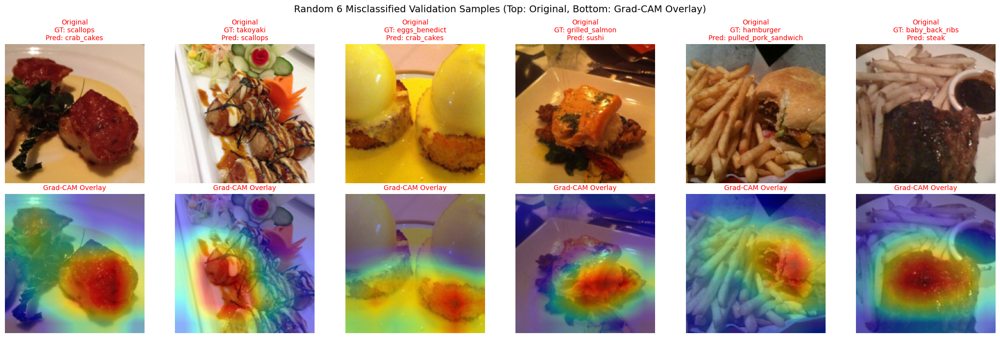

Saved overlays to: ./gradcam_misclassified_random6


In [46]:
# Cell 12B (Random): Grad-CAM for 6 RANDOM misclassified samples
# Purpose: Collect all misclassified validation examples, randomly sample 6, and visualize Grad-CAM overlays.

import os
import random
import numpy as np
import matplotlib.pyplot as plt

model.eval()
class_names = val_ds.classes

# ImageNet normalization (for de-normalization)
imagenet_mean = np.array([0.485, 0.456, 0.406])
imagenet_std = np.array([0.229, 0.224, 0.225])

def denormalize_img(img_tensor):
    """Convert normalized tensor image (3,H,W) -> numpy (H,W,3) in [0,1]."""
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = img * imagenet_std + imagenet_mean
    return np.clip(img, 0, 1)

def overlay_cam_on_image(img_rgb, cam, alpha=0.45):
    """Overlay Grad-CAM heatmap on RGB image."""
    heatmap = plt.cm.jet(cam)[..., :3]
    overlay = (1 - alpha) * img_rgb + alpha * heatmap
    return np.clip(overlay, 0, 1)

# Settings
num_errors = 6
save_dir = "./gradcam_misclassified_random6"
save_images = True
os.makedirs(save_dir, exist_ok=True)

# 1) Collect ALL misclassified samples into a pool
mis_pool = []  # each item: {"img": tensor(3,H,W), "gt": int, "pred": int}

with torch.no_grad():
    for images, labels in tqdm(val_loader, desc="Building misclassification pool"):
        images = images.to(device)
        labels = labels.to(device)

        logits = model(images)
        preds = torch.argmax(logits, dim=1)

        wrong_indices = torch.where(preds != labels)[0]
        for wi in wrong_indices:
            mis_pool.append({
                "img": images[wi].detach().cpu(),  # keep CPU copy
                "gt": int(labels[wi].item()),
                "pred": int(preds[wi].item())
            })

print(f"Total misclassified samples found: {len(mis_pool)}")

if len(mis_pool) == 0:
    print("No misclassified samples found (unexpected unless accuracy is 100%).")
else:
    # 2) Randomly sample 6 misclassified samples
    k = min(num_errors, len(mis_pool))
    chosen_samples = random.sample(mis_pool, k)

    # 3) Grad-CAM + visualization
    gradcam = GradCAM(model, target_layer)

    plt.figure(figsize=(3.5 * k, 7))

    for i, s in enumerate(chosen_samples):
        img_tensor = s["img"]
        gt = s["gt"]
        pd = s["pred"]

        input_tensor = img_tensor.unsqueeze(0).to(device)
        cam, pred_idx, _ = gradcam.generate(input_tensor, class_idx=None)

        img_rgb = denormalize_img(img_tensor)
        overlay = overlay_cam_on_image(img_rgb, cam, alpha=0.45)

        gt_name = class_names[gt]
        pred_name = class_names[pd]

        # --- Original ---
        plt.subplot(2, k, i + 1)
        plt.imshow(img_rgb)
        plt.axis("off")
        plt.title(f"Original\nGT: {gt_name}\nPred: {pred_name}", color="red", fontsize=10)

        # --- Overlay ---
        plt.subplot(2, k, k + i + 1)
        plt.imshow(overlay)
        plt.axis("off")
        plt.title("Grad-CAM Overlay", color="red", fontsize=10)

        # --- Save overlay ---
        if save_images:
            out_path = os.path.join(save_dir, f"{i+1}_gt_{gt_name}_pred_{pred_name}.png")
            plt.imsave(out_path, overlay)

    plt.suptitle("Random 6 Misclassified Validation Samples (Top: Original, Bottom: Grad-CAM Overlay)", fontsize=14)
    plt.tight_layout()
    plt.show()

    if save_images:
        print(f"Saved overlays to: {save_dir}")

    gradcam.remove_hooks()


Collect preds: 100%|██████████| 395/395 [00:33<00:00, 11.86it/s]



=== Top Confusion Pairs (GT -> Pred) ===
filet_mignon  ->  steak   (count=50)
steak  ->  pork_chop   (count=39)
chocolate_cake  ->  chocolate_mousse   (count=34)
tuna_tartare  ->  beef_tartare   (count=30)
cheesecake  ->  strawberry_shortcake   (count=24)
steak  ->  filet_mignon   (count=23)
spaghetti_carbonara  ->  spaghetti_bolognese   (count=21)
filet_mignon  ->  pork_chop   (count=20)

NOTE: The example retrieval assumes val_loader uses shuffle=False.
If your val_loader has shuffle=True, use direct val_ds sampling instead.


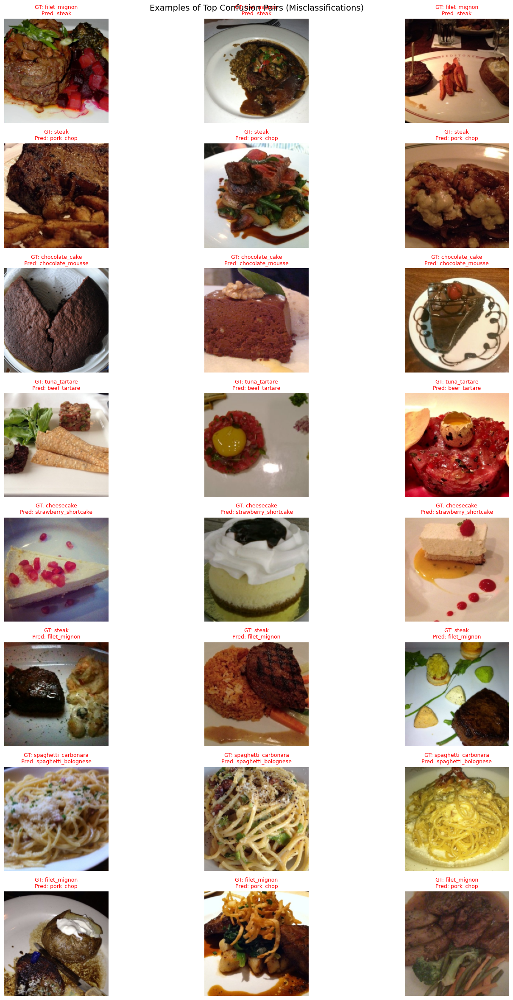

Saved Grad-CAM confusion overlays to: ./gradcam_confusions


In [43]:
# Cell 13: Misclassification mining + explain top confusion pairs
# Purpose: Mine common confusion pairs from the validation set and visualize examples.

import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

model.eval()

# 1) Collect predictions across the entire validation set
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in tqdm(val_loader, desc="Collect preds"):
        images = images.to(device)
        labels = labels.to(device)
        logits = model(images)
        preds = torch.argmax(logits, dim=1)

        all_preds.append(preds.cpu().numpy())
        all_labels.append(labels.cpu().numpy())

all_preds = np.concatenate(all_preds)
all_labels = np.concatenate(all_labels)

num_classes = len(class_names)

# 2) Build confusion matrix (rows=GT, cols=Pred)
conf_mat = np.zeros((num_classes, num_classes), dtype=np.int64)
for gt, pd in zip(all_labels, all_preds):
    conf_mat[gt, pd] += 1

# 3) Find top confusion pairs (excluding correct diagonal)
conf_no_diag = conf_mat.copy()
np.fill_diagonal(conf_no_diag, 0)

# Get top-K confusing pairs by count
top_k = 8
flat_idx = np.argsort(conf_no_diag.ravel())[::-1]
top_pairs = []
for idx in flat_idx:
    count = conf_no_diag.ravel()[idx]
    if count == 0:
        break
    gt = idx // num_classes
    pd = idx % num_classes
    top_pairs.append((gt, pd, int(count)))
    if len(top_pairs) >= top_k:
        break

print("\n=== Top Confusion Pairs (GT -> Pred) ===")
for gt, pd, count in top_pairs:
    print(f"{class_names[gt]}  ->  {class_names[pd]}   (count={count})")

# 4) Build an index list for each confusion pair to retrieve example images
pair_to_indices = defaultdict(list)
for i, (gt, pd) in enumerate(zip(all_labels, all_preds)):
    if gt != pd:
        pair_to_indices[(gt, pd)].append(i)

# Helper: map "global index in val_ds" to (image, label)
# Note: val_loader iterates in the same order as val_ds when shuffle=False (your default).
# If you changed shuffle=True for val_loader, this mapping will NOT be correct.
val_is_shuffled = getattr(val_loader, "shuffle", False)  # often not available; see note below

print("\nNOTE: The example retrieval assumes val_loader uses shuffle=False.")
print("If your val_loader has shuffle=True, use direct val_ds sampling instead.")

# 5) Visualize a few examples for each confusion pair
examples_per_pair = 3

plt.figure(figsize=(16, 3 * len(top_pairs)))

plot_row = 1
for gt, pd, count in top_pairs:
    indices = pair_to_indices[(gt, pd)]
    if len(indices) == 0:
        continue

    chosen = indices[:examples_per_pair]  # first few examples
    for j, ds_idx in enumerate(chosen):
        img_tensor, label = val_ds[ds_idx]  # ds_idx matches dataset order if shuffle=False
        img_rgb = denormalize_img(img_tensor)

        plt.subplot(len(top_pairs), examples_per_pair, plot_row)
        plt.imshow(img_rgb)
        plt.axis("off")
        plt.title(
            f"GT: {class_names[gt]}\nPred: {class_names[pd]}",
            fontsize=9,
            color="red"
        )
        plot_row += 1

plt.suptitle("Examples of Top Confusion Pairs (Misclassifications)", fontsize=14)
plt.tight_layout()
plt.show()

# ----------------------------
# Optional: Grad-CAM on these misclassified examples
# ----------------------------
do_gradcam_on_confusions = True
if do_gradcam_on_confusions:
    gradcam = GradCAM(model, target_layer)
    save_dir = "./gradcam_confusions"
    os.makedirs(save_dir, exist_ok=True)

    # For each top pair, run Grad-CAM on 1 example
    for gt, pd, count in top_pairs:
        indices = pair_to_indices[(gt, pd)]
        if len(indices) == 0:
            continue

        ds_idx = indices[0]
        img_tensor, label = val_ds[ds_idx]
        input_tensor = img_tensor.unsqueeze(0).to(device)

        cam, pred_idx, _ = gradcam.generate(input_tensor, class_idx=pred_idx if False else None)

        img_rgb = denormalize_img(img_tensor)
        overlay = overlay_cam_on_image(img_rgb, cam, alpha=0.45)

        out_path = os.path.join(
            save_dir,
            f"conf_gt_{class_names[gt]}_pred_{class_names[pd]}_idx{ds_idx}.png"
        )
        plt.imsave(out_path, overlay)

    gradcam.remove_hooks()
    print(f"Saved Grad-CAM confusion overlays to: {save_dir}")
